# EXPERIMENT - STATE-GROUP-3

# State Groups:

- `group_1`: Patients with low toxicity and low tumor size  - W_0 ~ N(0.5, 0.16**2), T_0 ~ N(0.5, 0.16**2)
- `group_2`: Patients with high toxicity and low tumor size - W_0 ~ N(1.5, 0.16**2), T_0 ~ N(0.5, 0.16**2)
- `group_3`: Patients with low initial toxicity and high tumor size - W_0 ~ N(0.5, 0.16**2), T_0 ~ N(1.5, 0.16**2)
- `group_4`: Patients with high toxicity and high tumor size - W_0 ~ N(1.5, 0.16**2), T_0 ~ N(1.5, 0.16**2)
-  `None`  : Patients with toxicity and tumor size sample from - W_0 ~ U(0,2), T_0 ~  U(0,2)

In [1]:
%load_ext autoreload
%autoreload 2

import tqdm
import _set_path
from pbpi.algo_core.training import evaluations_per_config

In [2]:
ALGO_TYPE = {'original': {'name': 'original', 'exploration': False}
            ,'modified': {'name': 'modified', 'exploration': True} }

---
## Original experiment setup

### Original algorithm

In [3]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 1
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': 'group_3'
          , 'init_state_tag': 'g3'
          }

algorithm = ALGO_TYPE['original']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 3


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


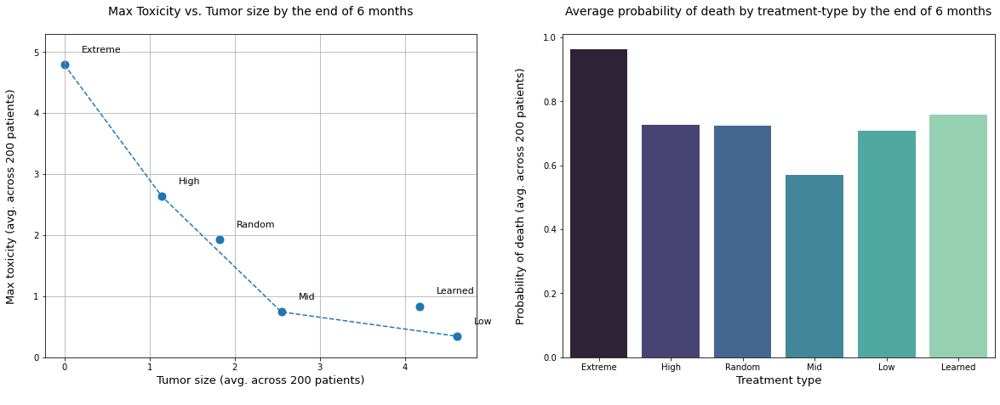

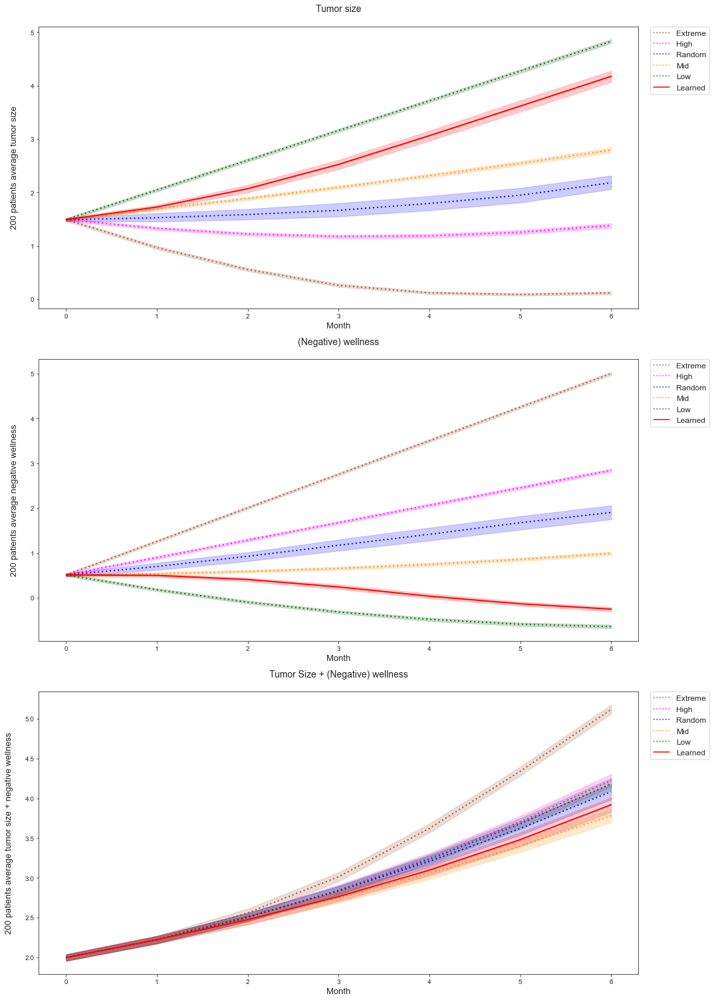


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 4.1720177843777915
                         - Avg. max. toxicity : 0.8369562942724303
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.961675729348976
                         - Avg. prob. of death : 0.7580343994141662



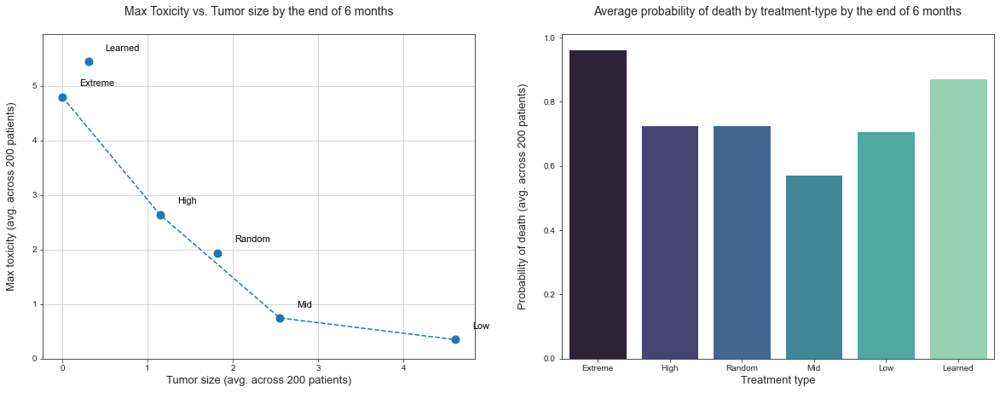

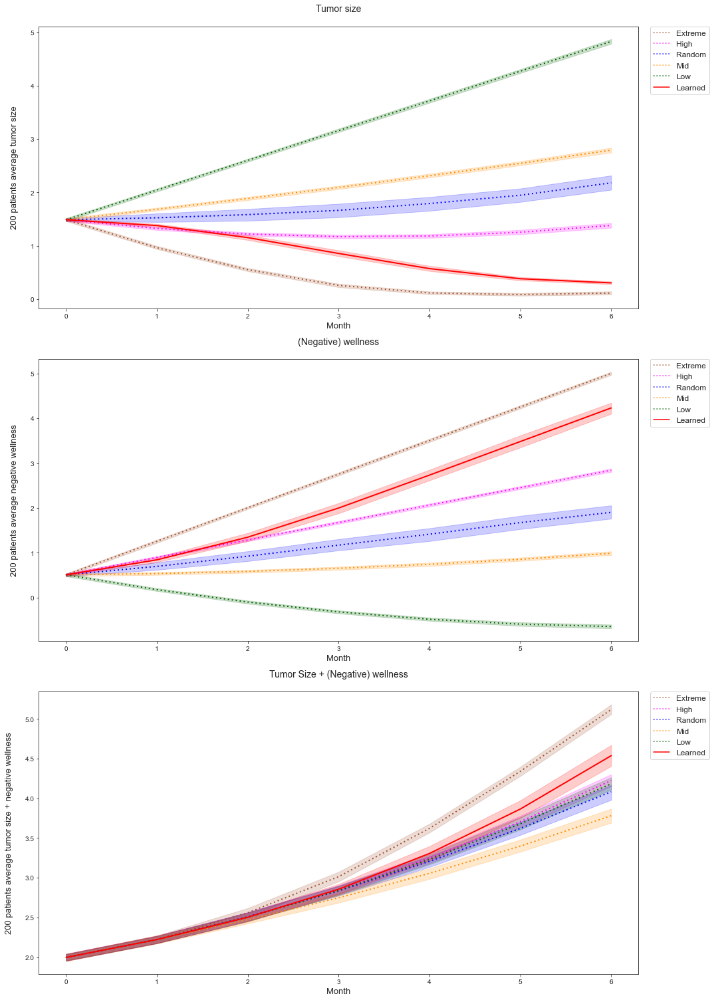


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 0.3060573445226407
                         - Avg. max. toxicity : 5.444637709589318
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9934300845939137
                         - Avg. prob. of death : 0.8727799750401793

Averege death rate increased by 10%! Policy performance decreased! Run-1 terminated!

Evaluations: 100%|██████████| 1/1 [44:20<00:00, 2660.18s/it]


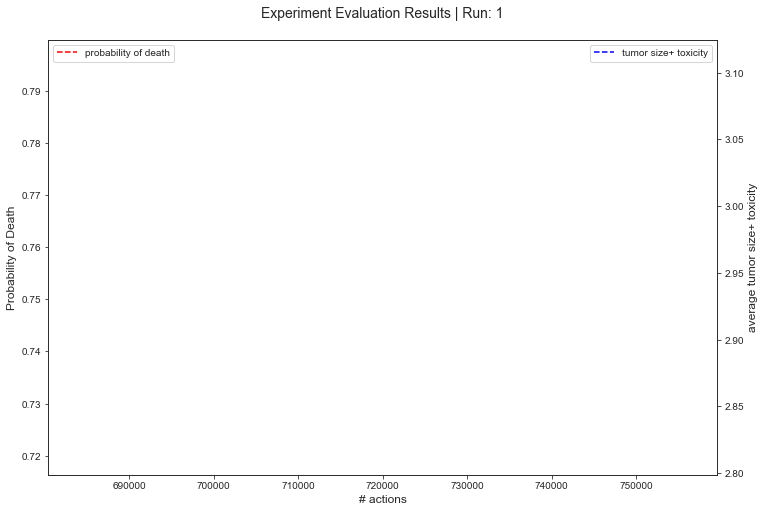

In [4]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 6
                                                , treatment_length_eval     = 6
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = False # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 3
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

### Modified algorithm

In [5]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 2
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': 'group_3'
          , 'init_state_tag': 'g3'
          }

algorithm = ALGO_TYPE['modified']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 3


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


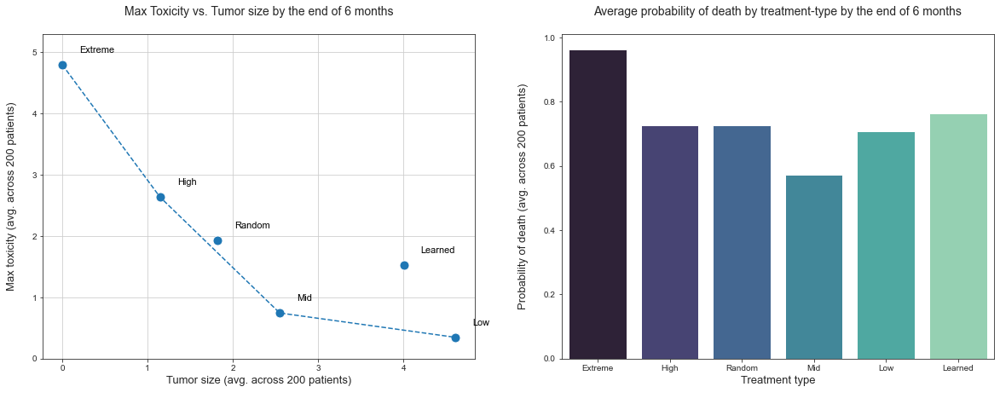

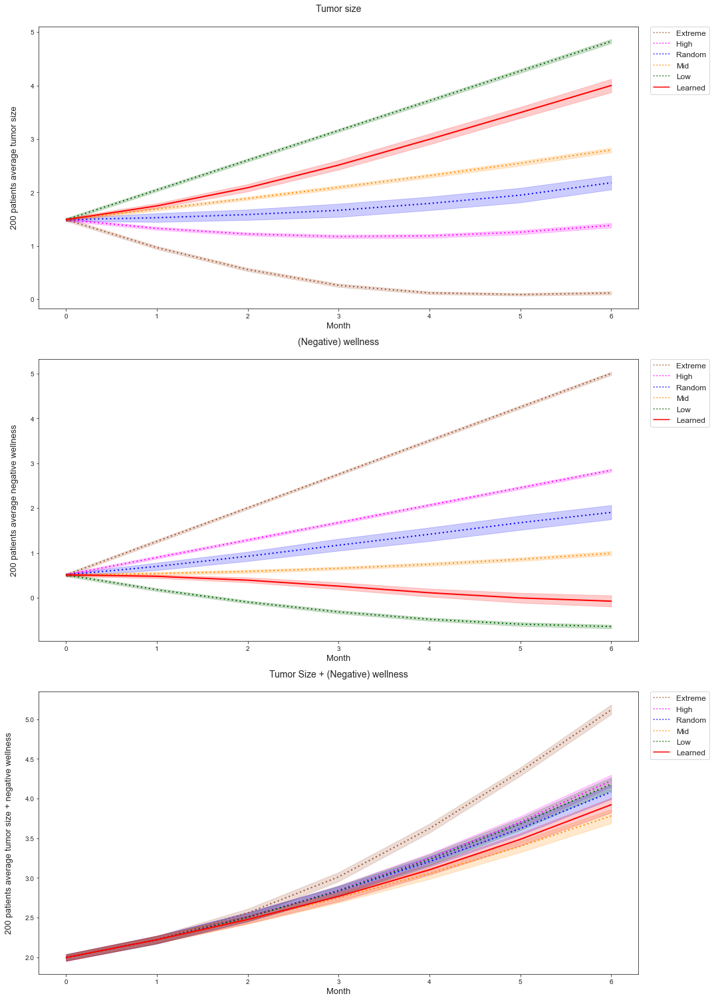


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 4.000068199312591
                         - Avg. max. toxicity : 1.520039957294625
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9622214474536146
                         - Avg. prob. of death : 0.7641479374829302



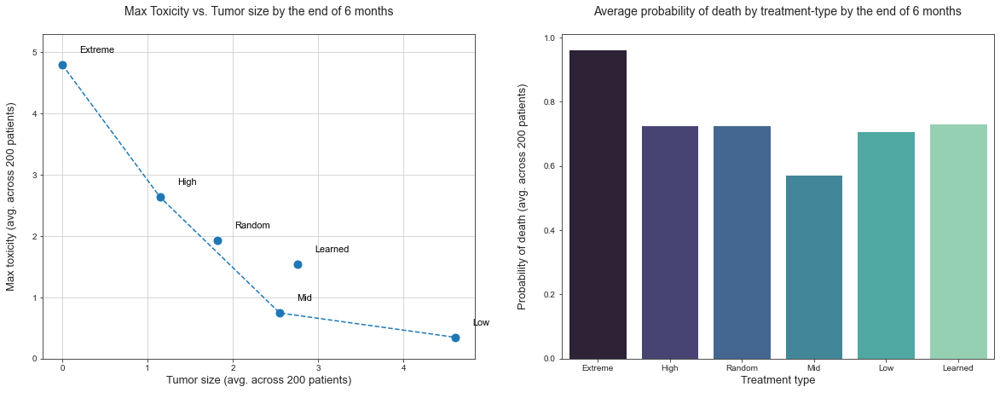

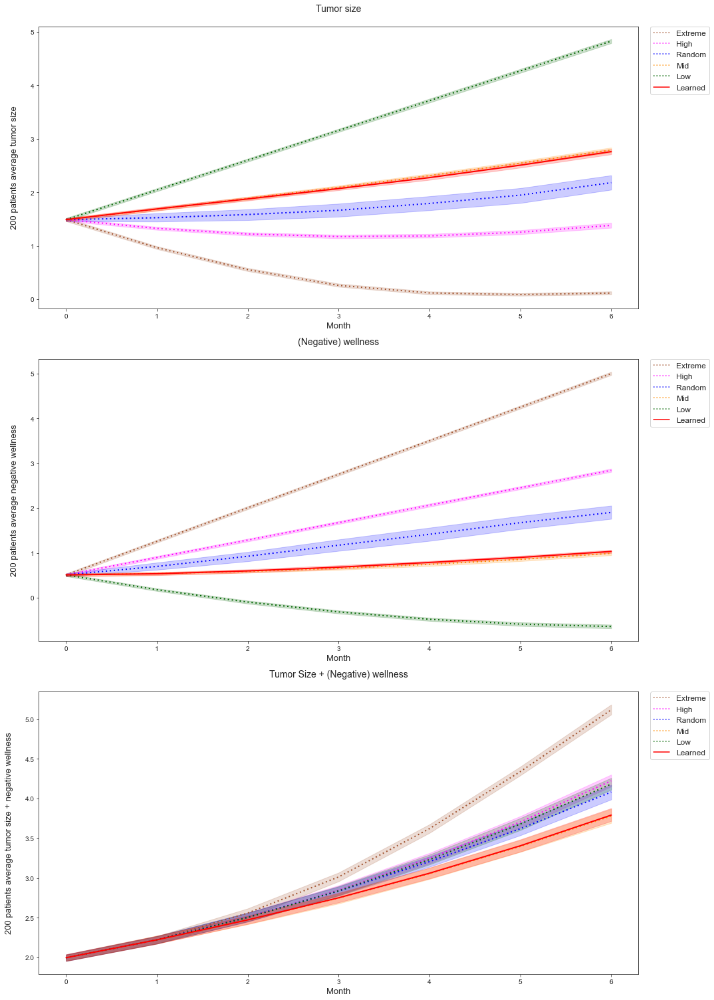


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 2.760570329850552
                         - Avg. max. toxicity : 1.5336307069978887
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9557580647143125
                         - Avg. prob. of death : 0.7313034579902543



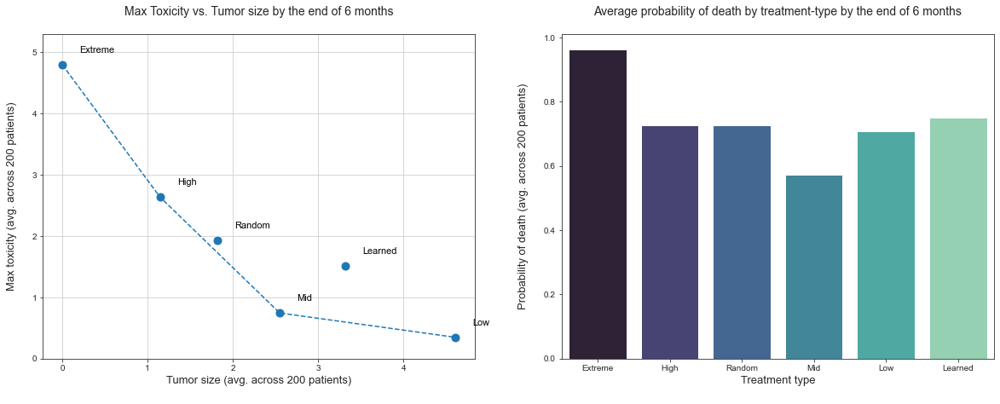

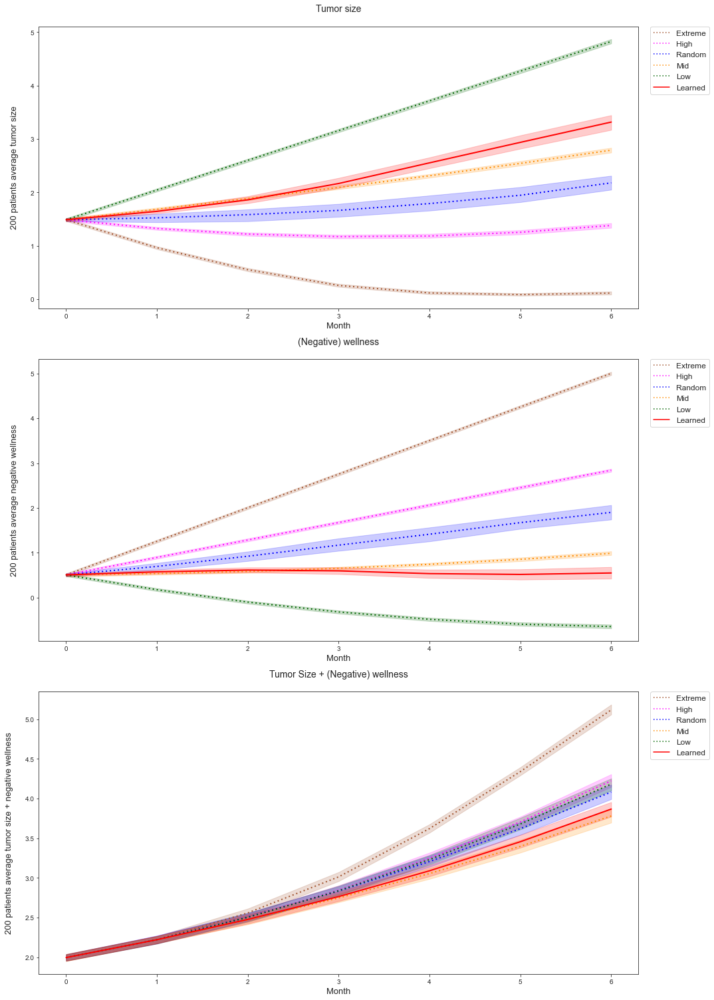


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 3.317475480430436
                         - Avg. max. toxicity : 1.5129809768149867
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.959893297274828
                         - Avg. prob. of death : 0.7508051608263174



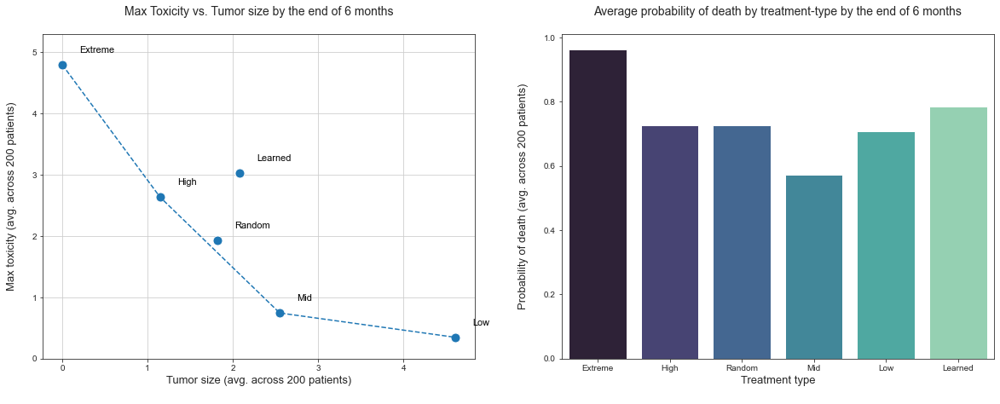

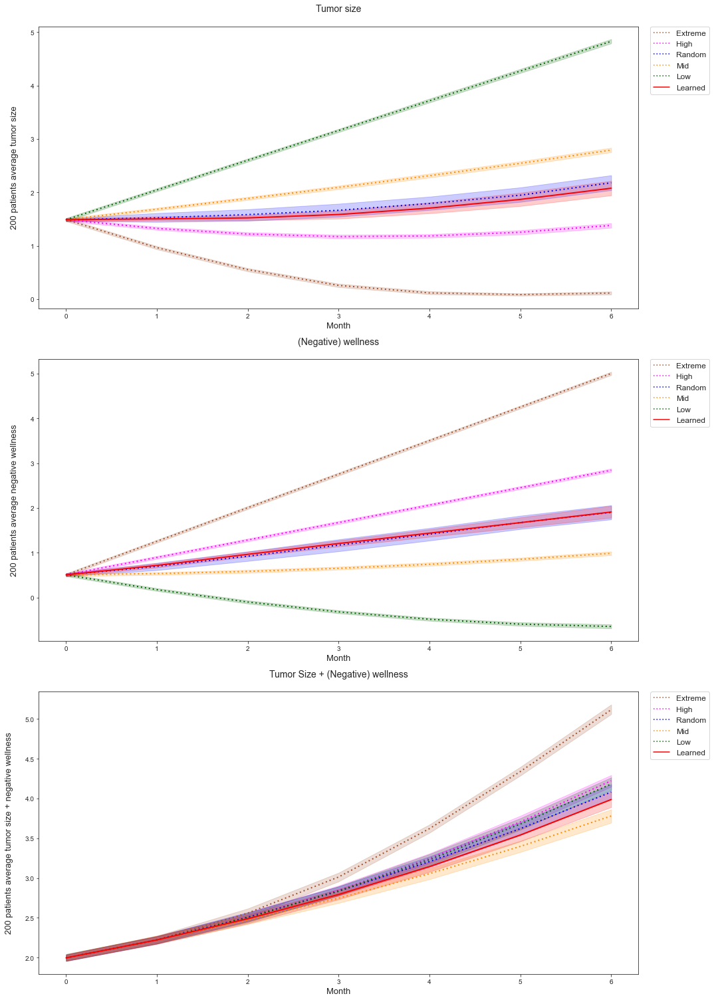


Policy Iteration: 4 - Evaluation results:
                         - Avg. ending tumor size : 2.0774702830921945
                         - Avg. max. toxicity : 3.0253901911432335
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9669895094032257
                         - Avg. prob. of death : 0.7854528533190195



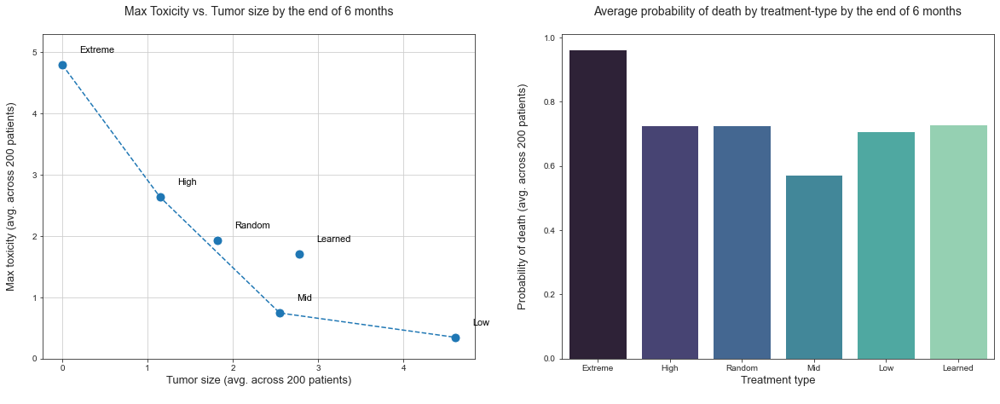

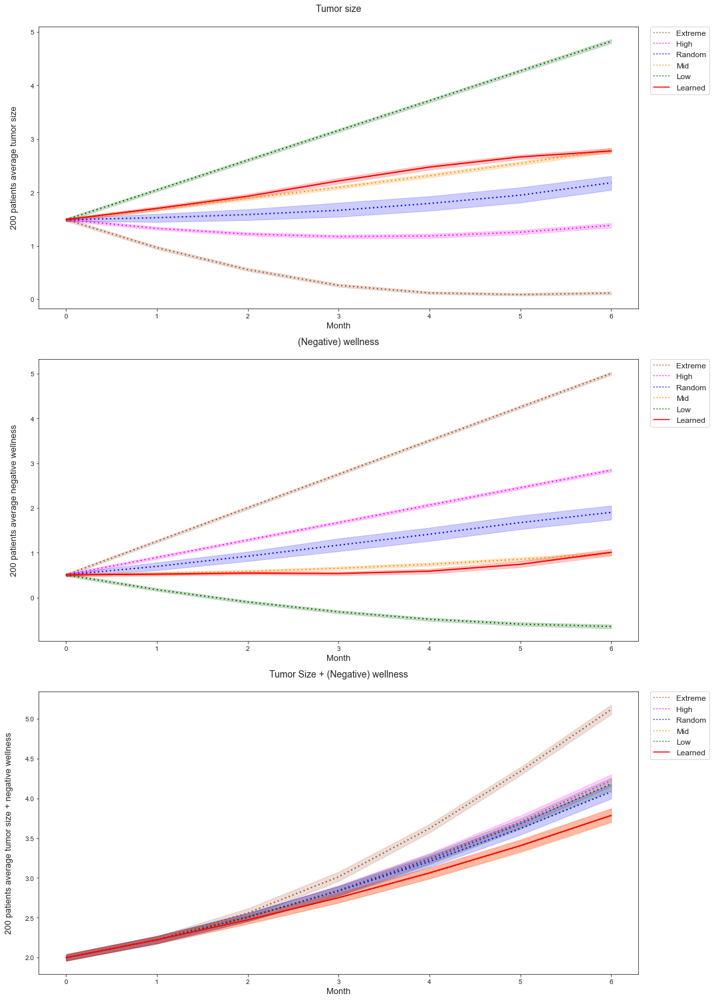


Policy Iteration: 5 - Evaluation results:
                         - Avg. ending tumor size : 2.773937823979151
                         - Avg. max. toxicity : 1.7087835051309241
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.955600862618966
                         - Avg. prob. of death : 0.7293389555832056



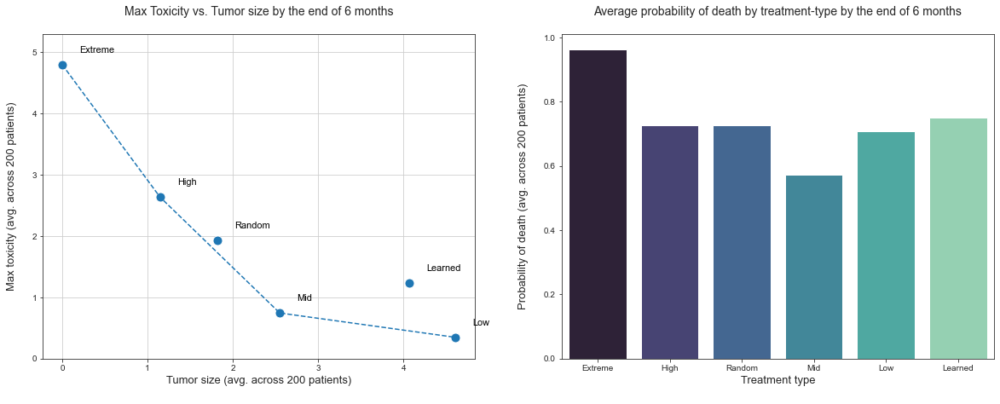

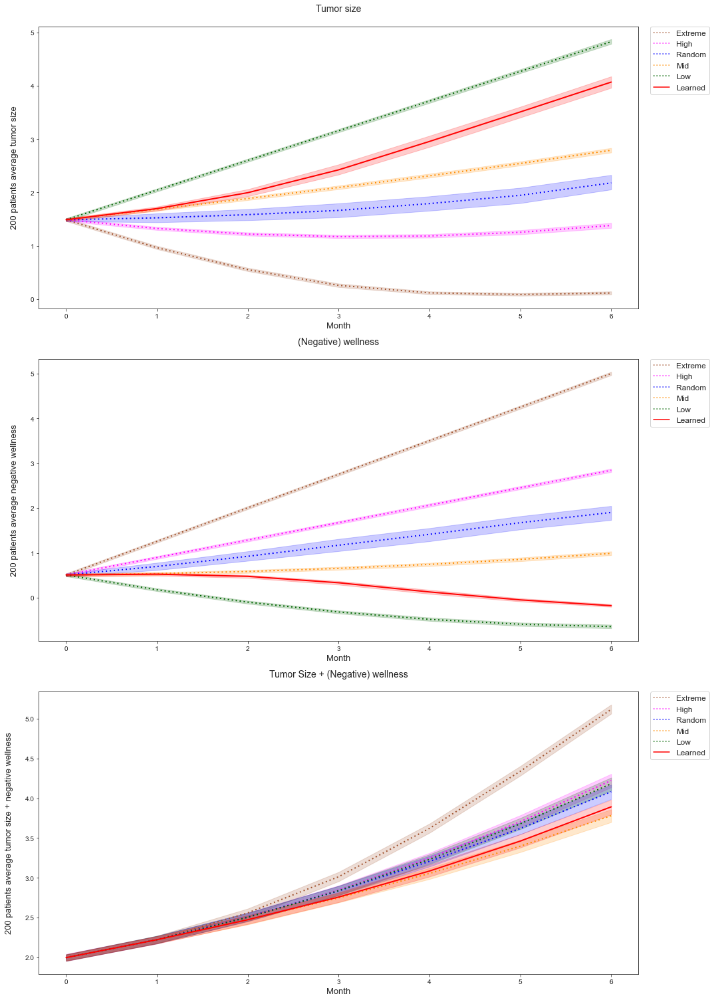


Policy Iteration: 6 - Evaluation results:
                         - Avg. ending tumor size : 4.069507917014536
                         - Avg. max. toxicity : 1.2316531789369491
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9602394955035036
                         - Avg. prob. of death : 0.7513468294103354



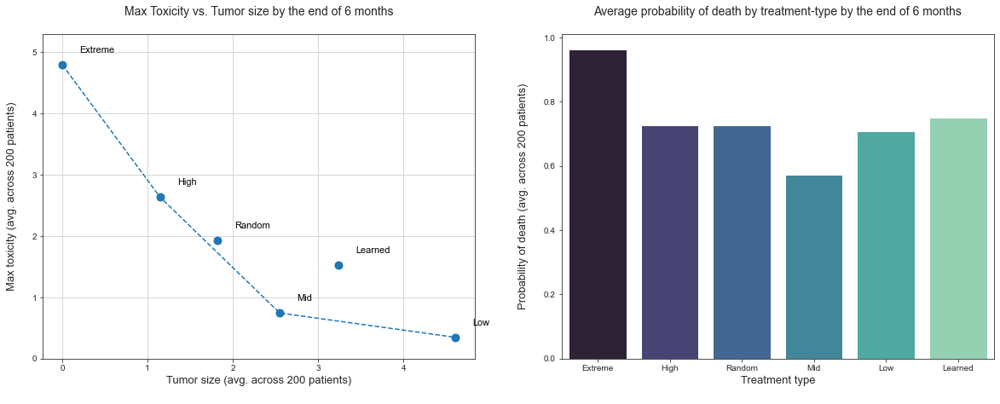

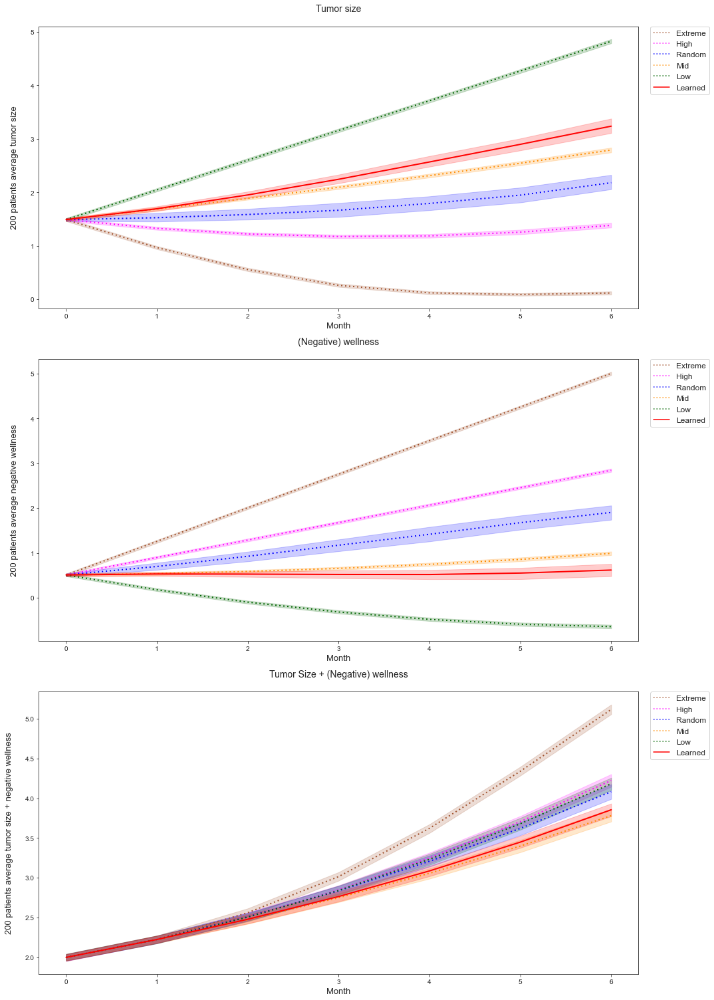


Policy Iteration: 7 - Evaluation results:
                         - Avg. ending tumor size : 3.2374961691189195
                         - Avg. max. toxicity : 1.528011544539244
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9591898829451413
                         - Avg. prob. of death : 0.7488763365504965



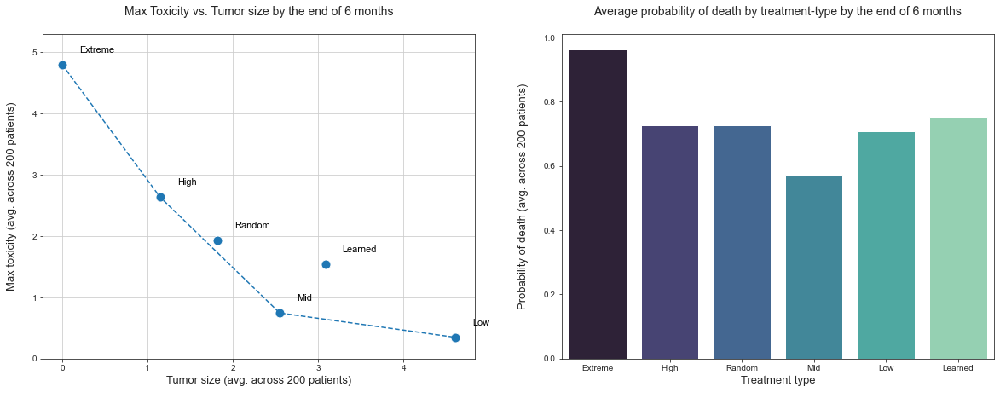

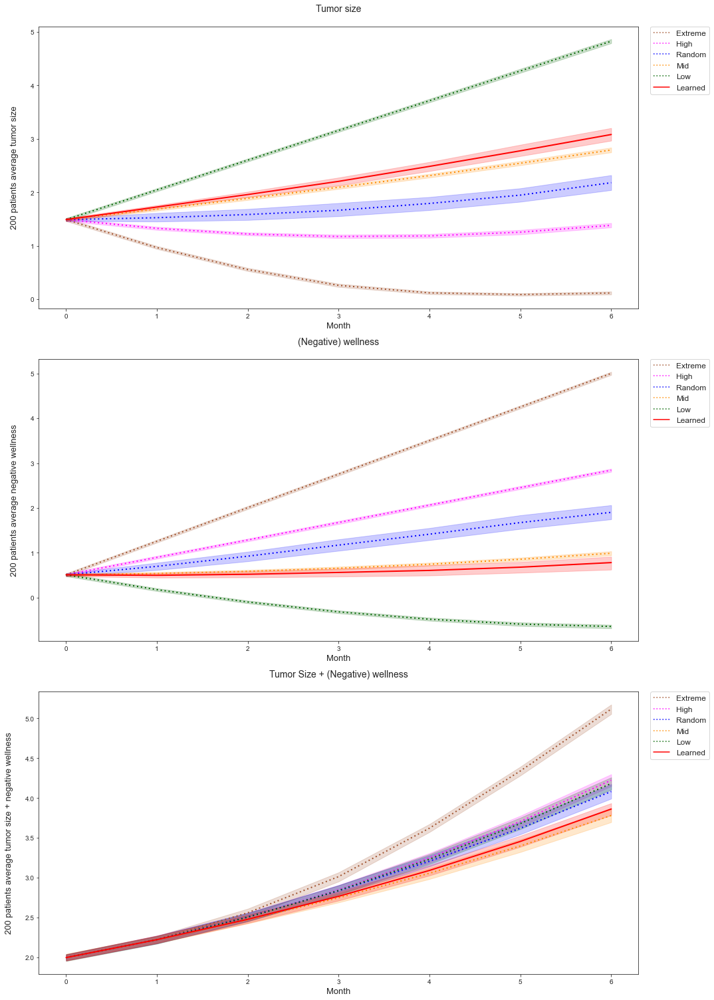


Policy Iteration: 8 - Evaluation results:
                         - Avg. ending tumor size : 3.0811683312581373
                         - Avg. max. toxicity : 1.5360299995884439
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.959784345467309
                         - Avg. prob. of death : 0.7533568976383347



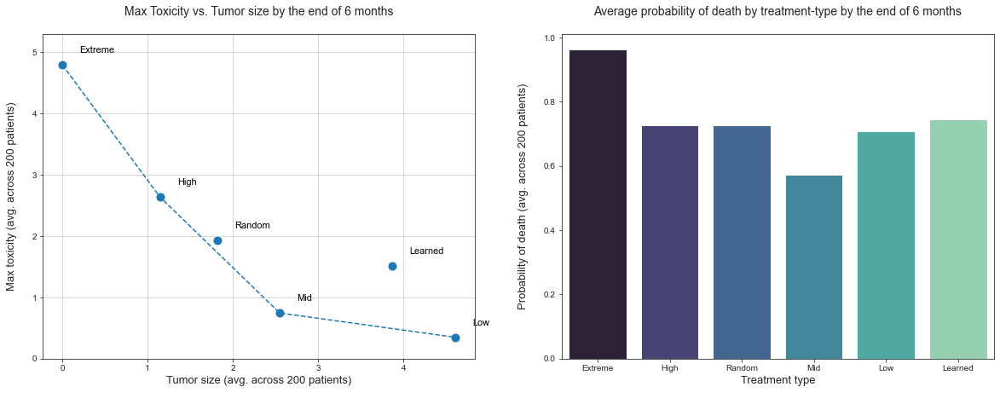

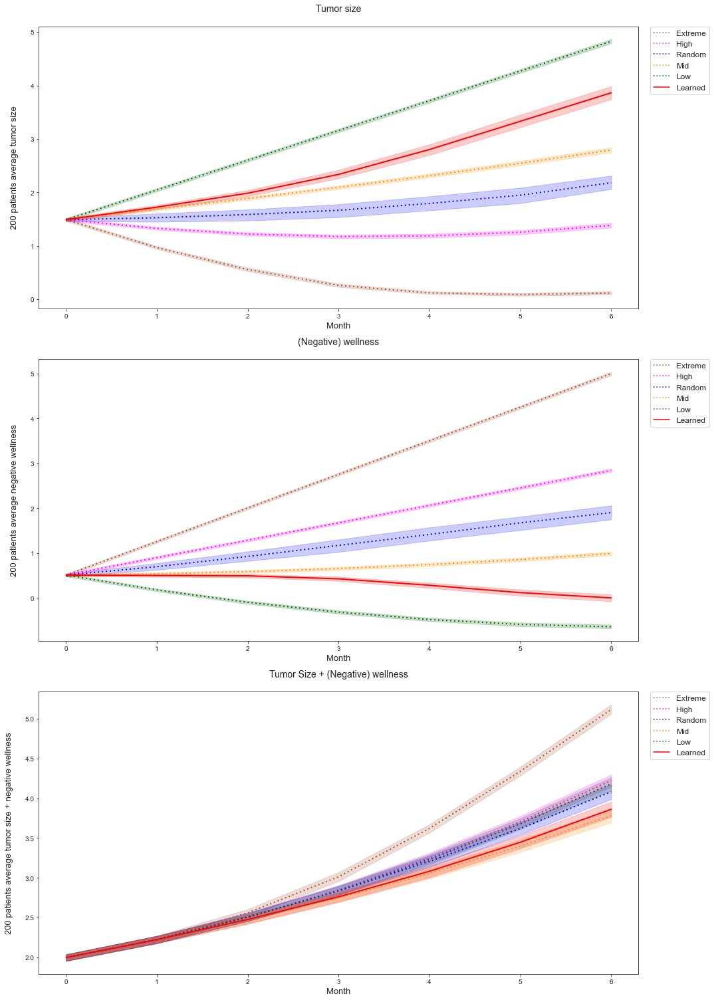


Policy Iteration: 9 - Evaluation results:
                         - Avg. ending tumor size : 3.8632648508245775
                         - Avg. max. toxicity : 1.5173527943093066
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9592182524496002
                         - Avg. prob. of death : 0.7448200886090255



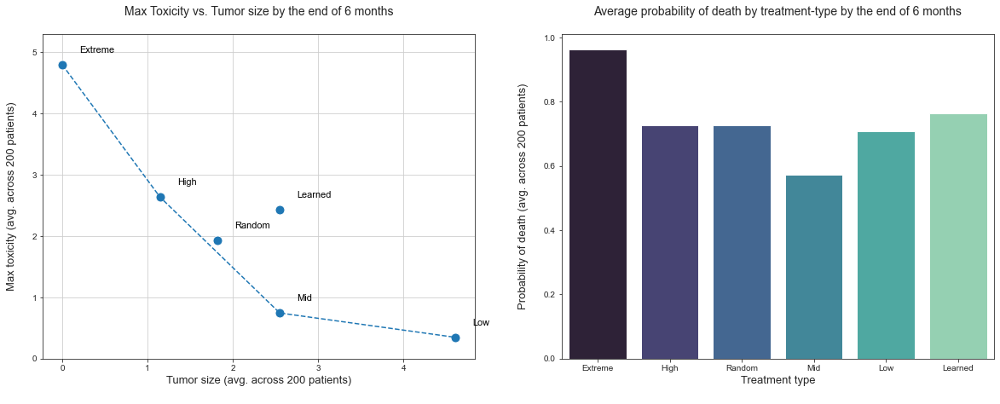

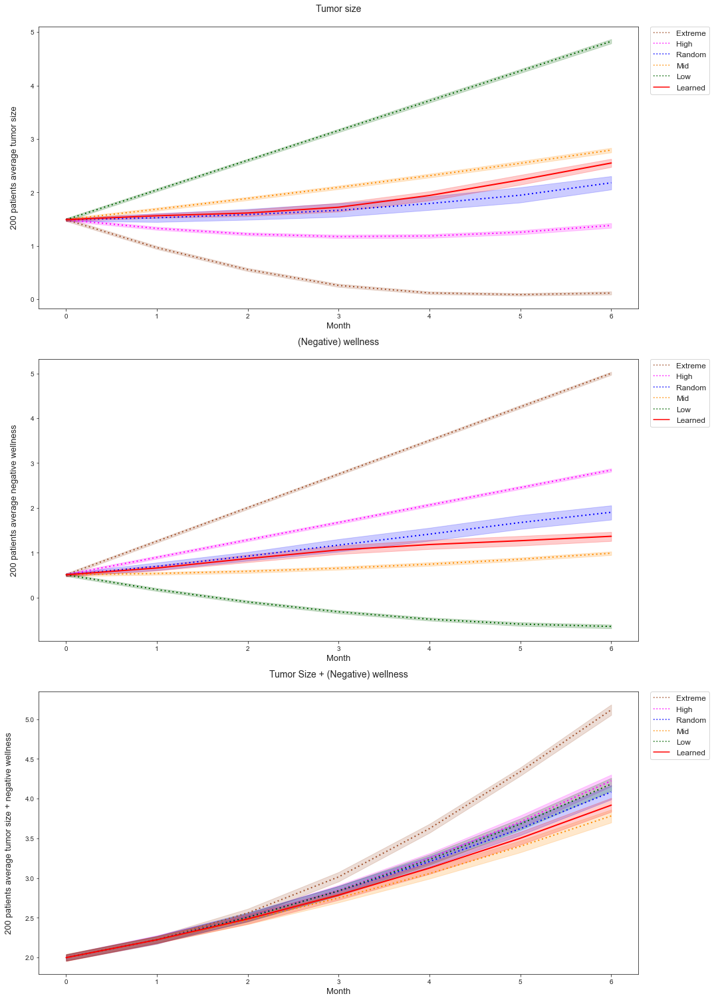


Policy Iteration: 10 - Evaluation results:
                         - Avg. ending tumor size : 2.5494196506117923
                         - Avg. max. toxicity : 2.4228173258184387
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.963551873279575
                         - Avg. prob. of death : 0.763817064834329


Evaluations: 100%|██████████| 1/1 [2:58:43<00:00, 10723.92s/it]


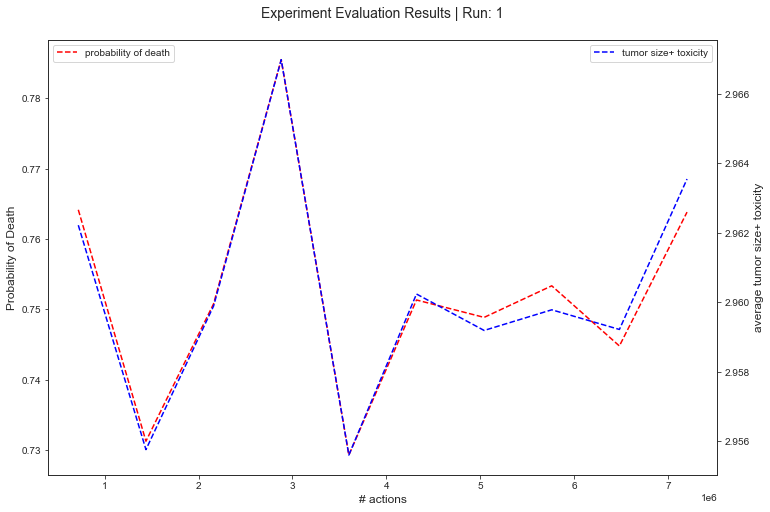

In [6]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']  
                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 6
                                                , treatment_length_eval     = 6
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = False # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 3
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

---
## Using `tumor size + toxicity` to generate preferences

### Original algorithm

In [7]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 3
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': 'group_3'
          , 'init_state_tag': 'g3'
          }

algorithm = ALGO_TYPE['original']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 3


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


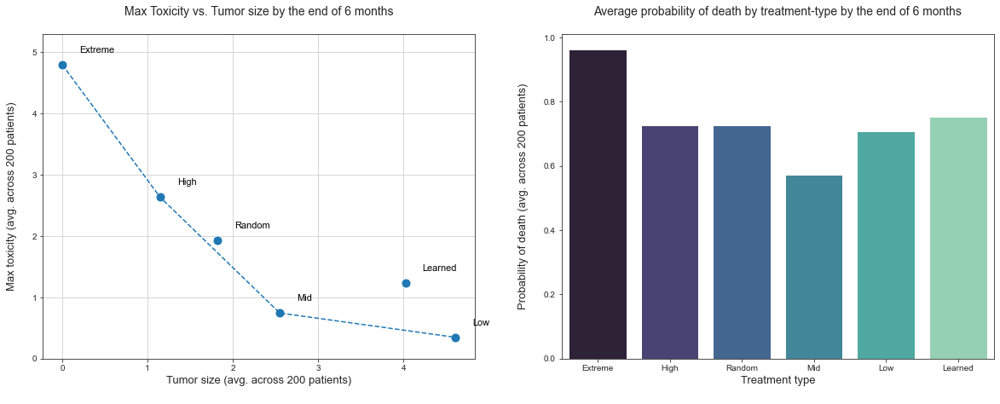

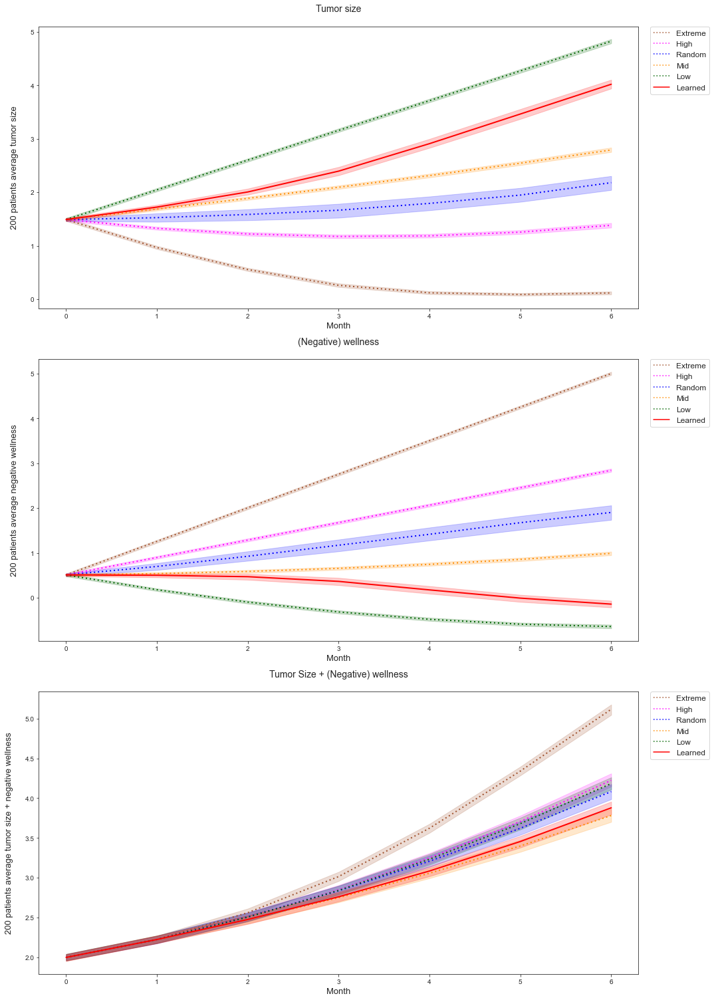


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 4.021014223017515
                         - Avg. max. toxicity : 1.2375159563354445
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9597003164585383
                         - Avg. prob. of death : 0.7538997185096583



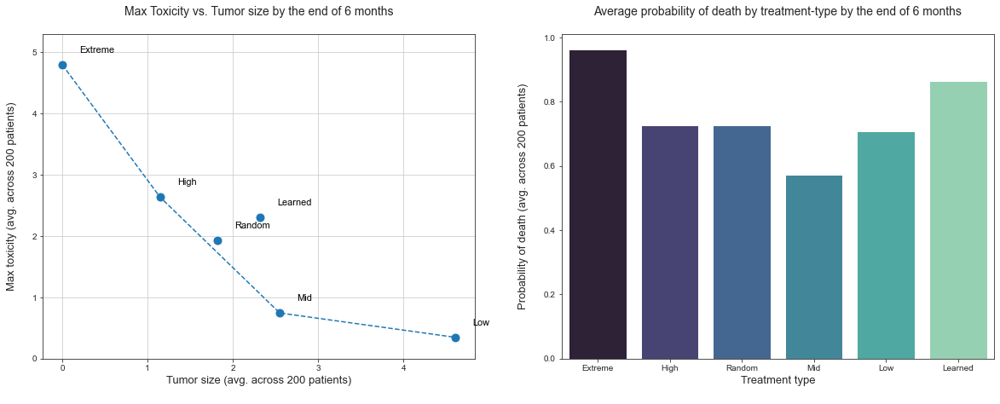

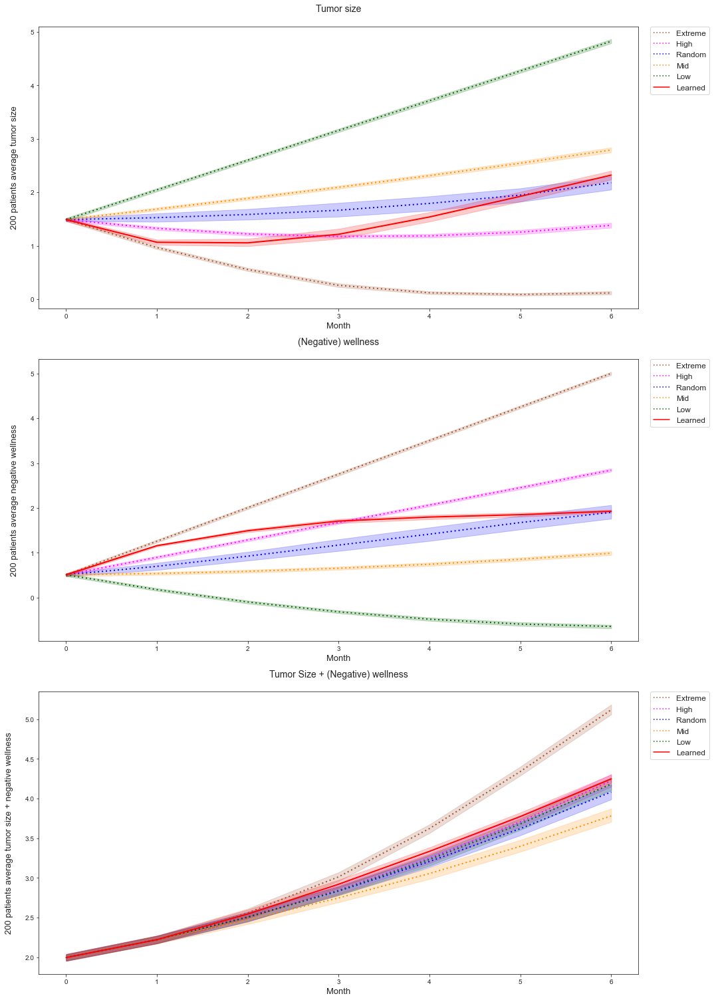


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 2.321203459937181
                         - Avg. max. toxicity : 2.3047971525087276
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9875797593807736
                         - Avg. prob. of death : 0.8633739271514059

Averege death rate increased by 10%! Policy performance decreased! Run-1 terminated!

Evaluations: 100%|██████████| 1/1 [41:13<00:00, 2473.58s/it]


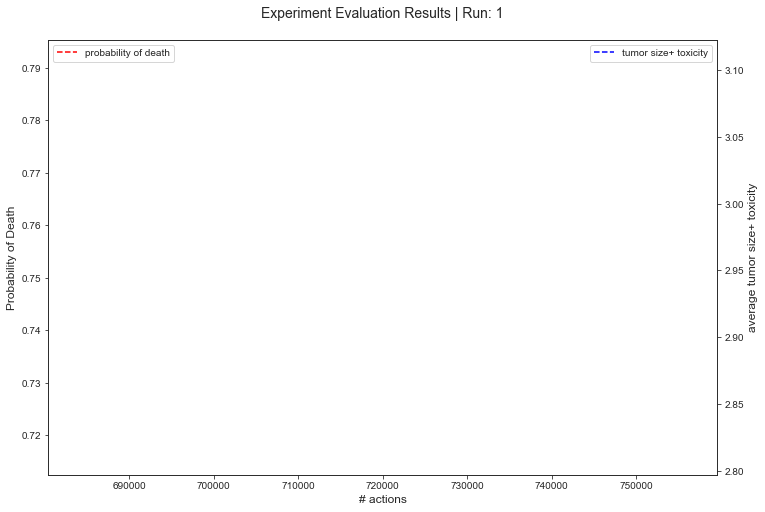

In [8]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 6
                                                , treatment_length_eval     = 6
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = True # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 3
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

### Modified algorithm

In [9]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 4
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.1]
          , 'init_state_group': 'group_3'
          , 'init_state_tag': 'g3'
          }

algorithm = ALGO_TYPE['modified']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 3


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.1


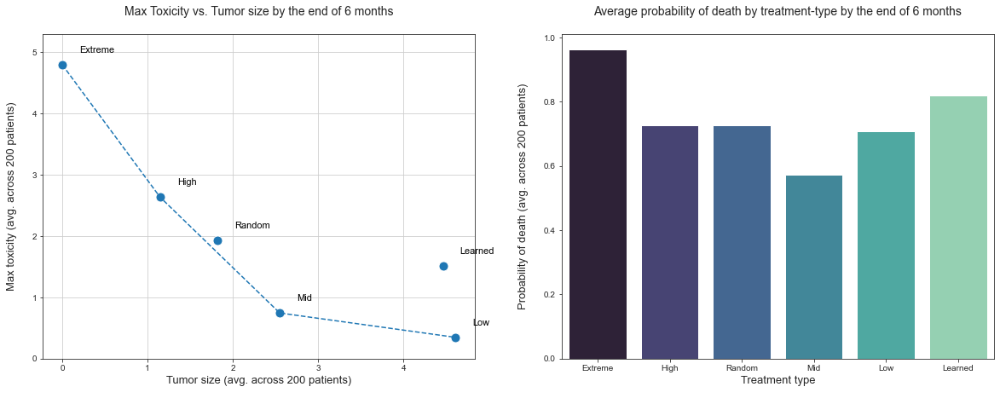

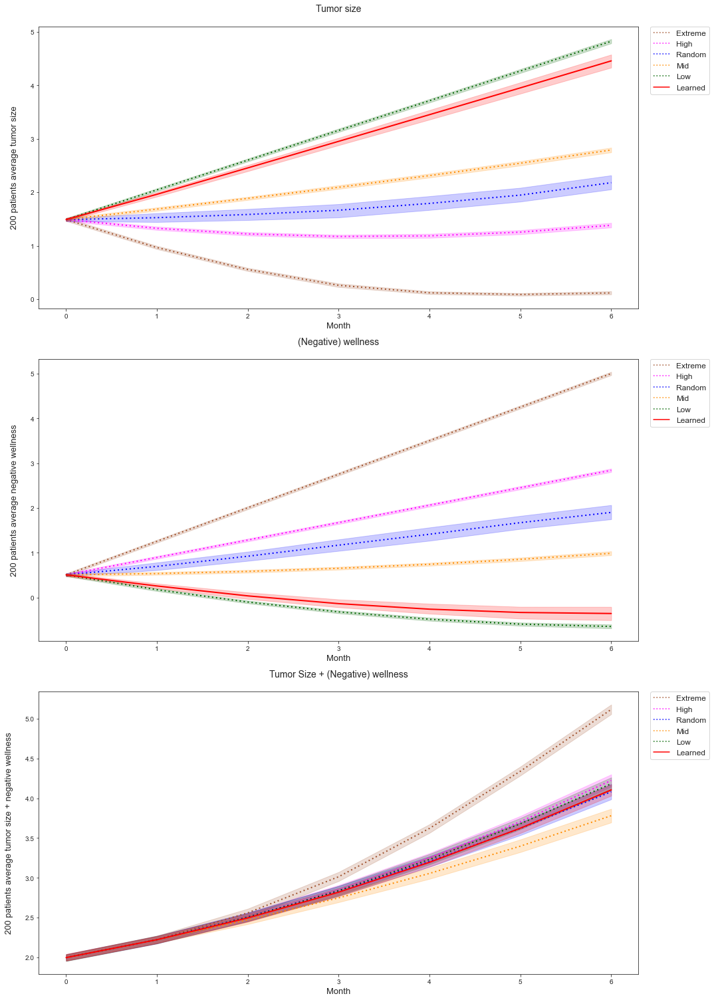


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 4.459816834549686
                         - Avg. max. toxicity : 1.5143585106666173
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9737582211129827
                         - Avg. prob. of death : 0.8187231969519982



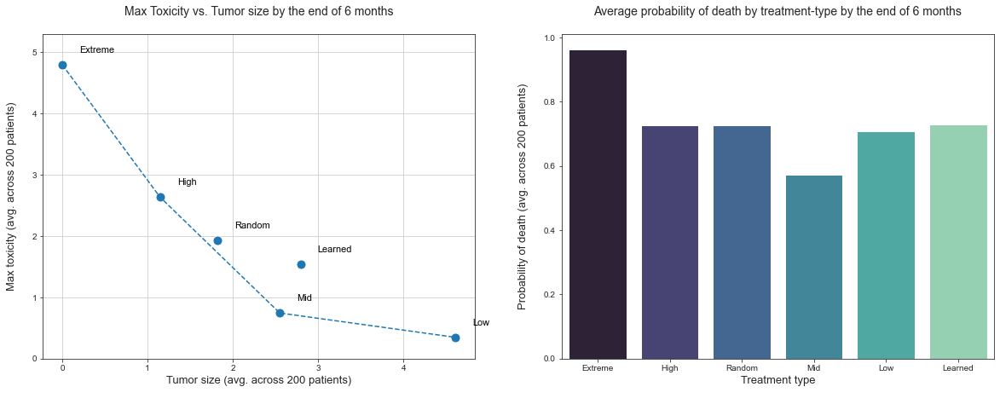

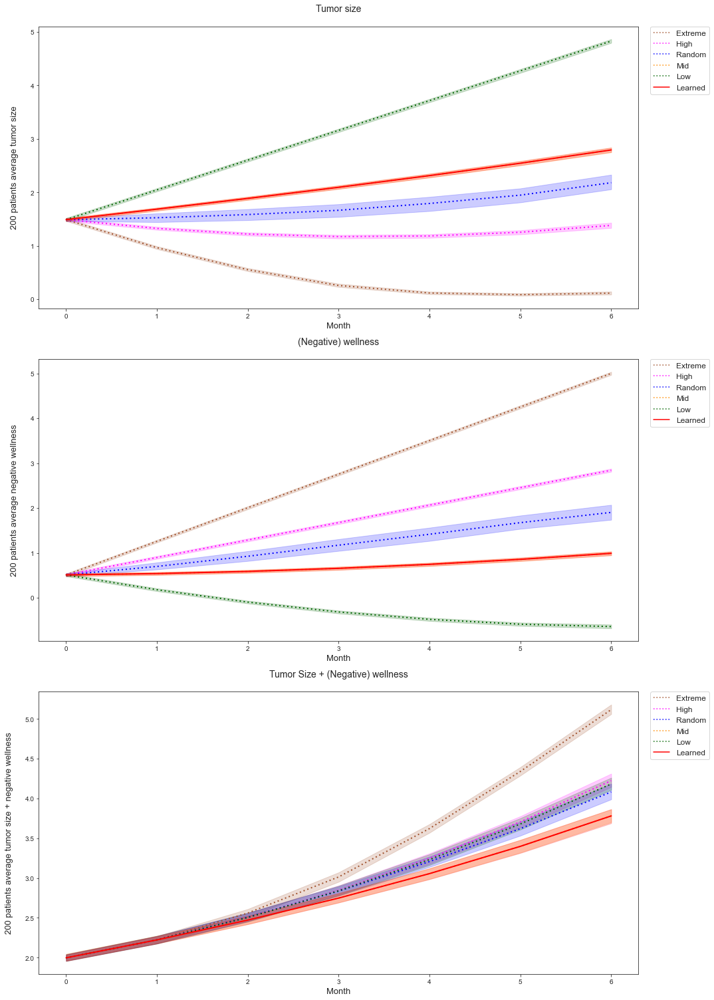


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 2.791683617653831
                         - Avg. max. toxicity : 1.5334422500625657
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9550384514914434
                         - Avg. prob. of death : 0.728048463421332



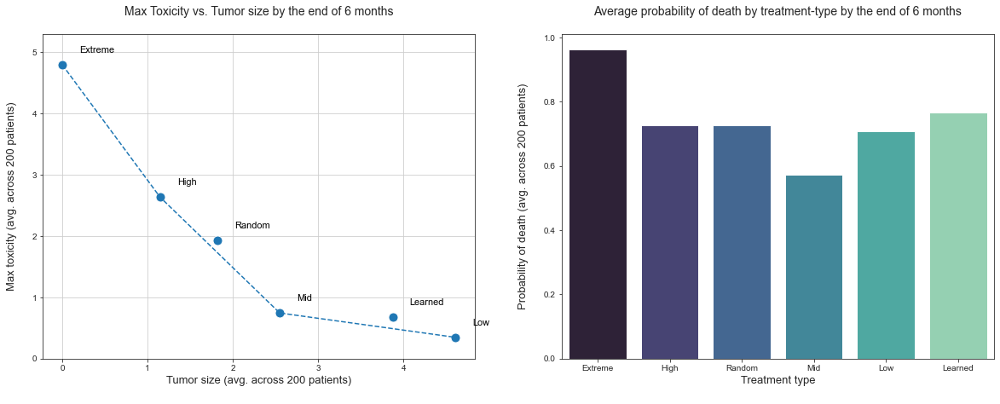

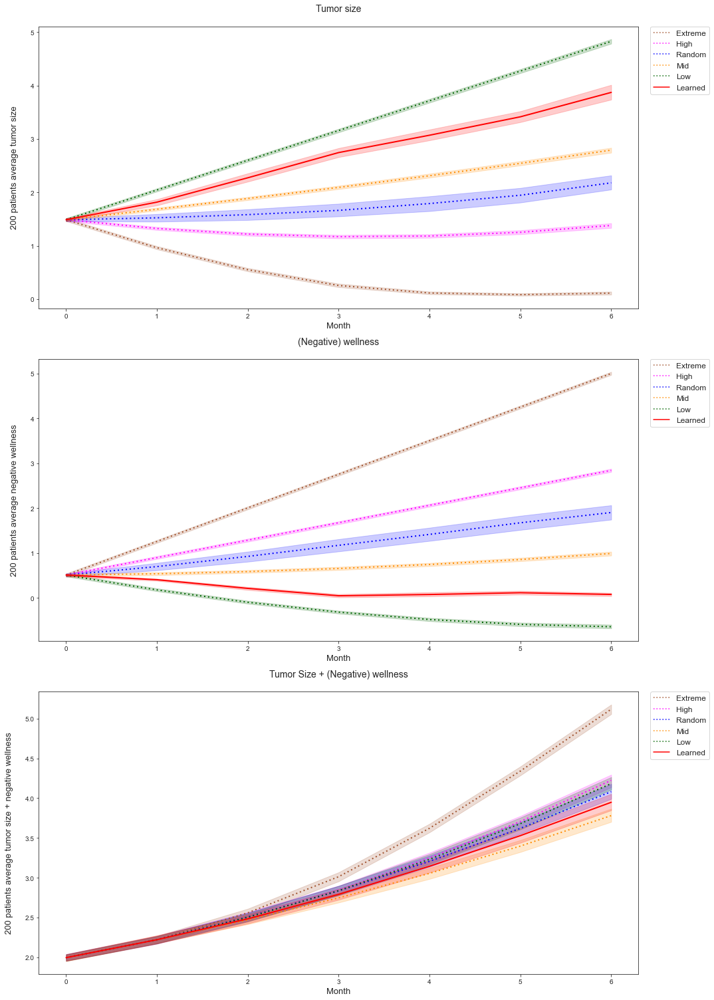


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 3.871345851806057
                         - Avg. max. toxicity : 0.6822771793228118
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.965621193999375
                         - Avg. prob. of death : 0.7671038229696354



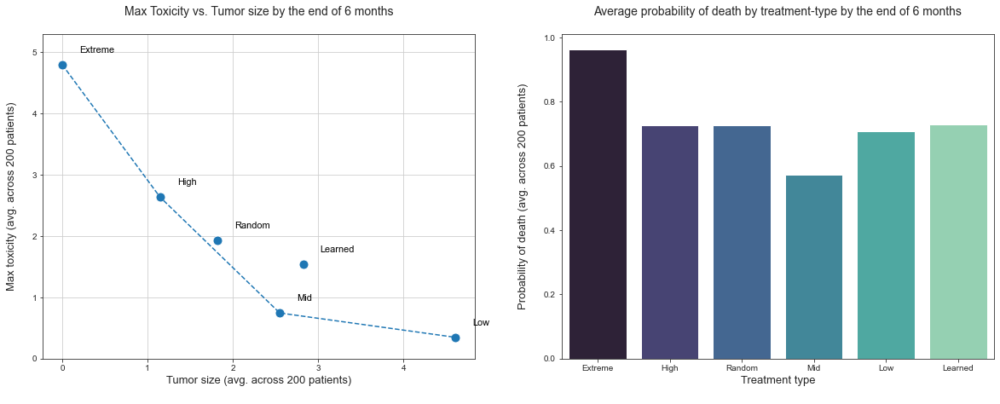

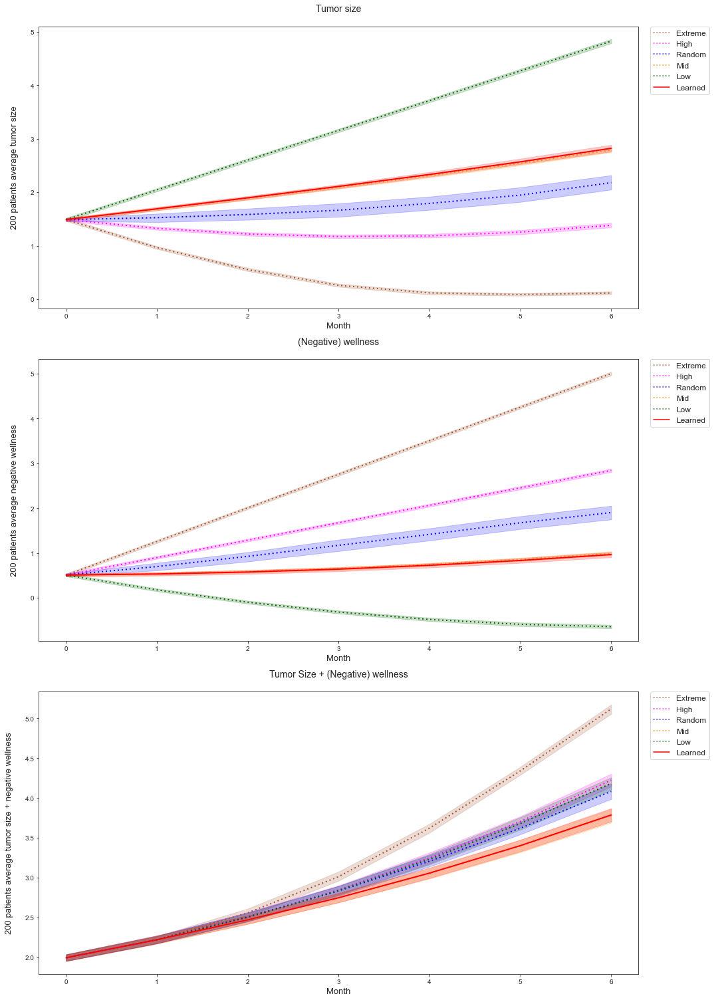


Policy Iteration: 4 - Evaluation results:
                         - Avg. ending tumor size : 2.822412593560464
                         - Avg. max. toxicity : 1.5334422500625657
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9553966275059427
                         - Avg. prob. of death : 0.7298933496748409



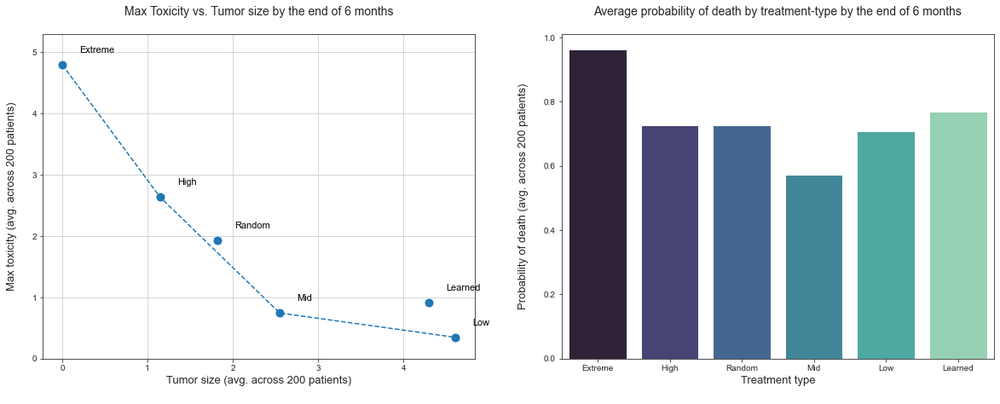

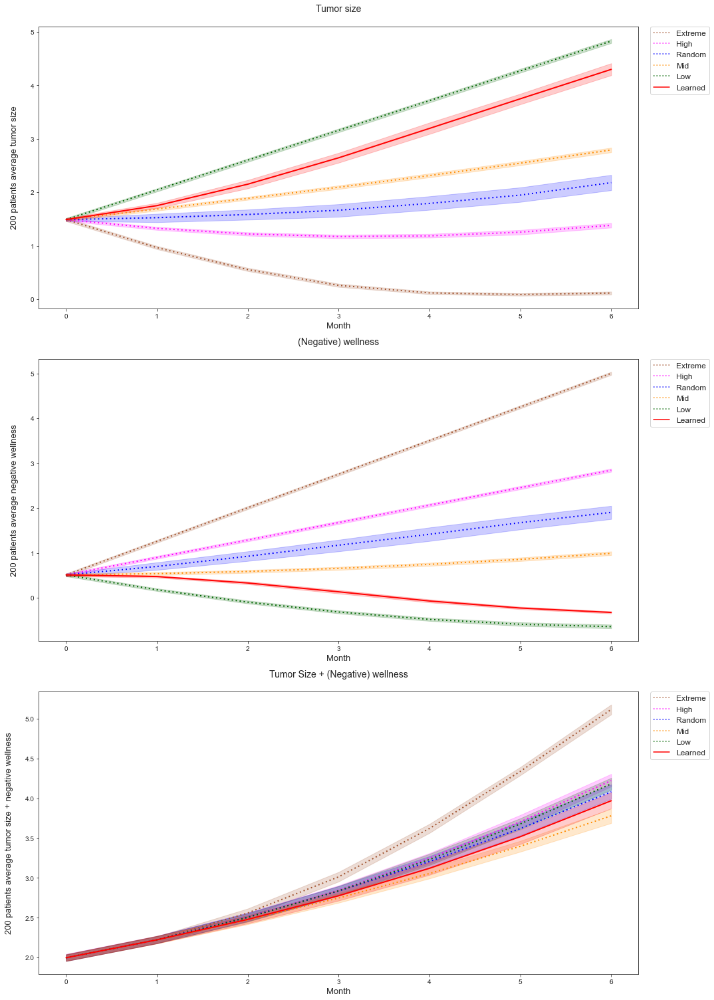


Policy Iteration: 5 - Evaluation results:
                         - Avg. ending tumor size : 4.298005494263793
                         - Avg. max. toxicity : 0.9181822262888748
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.964852049076933
                         - Avg. prob. of death : 0.7694993868245712



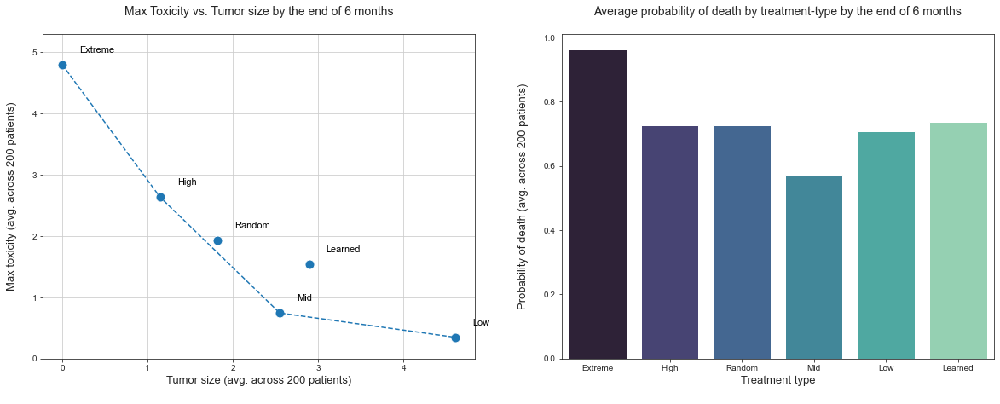

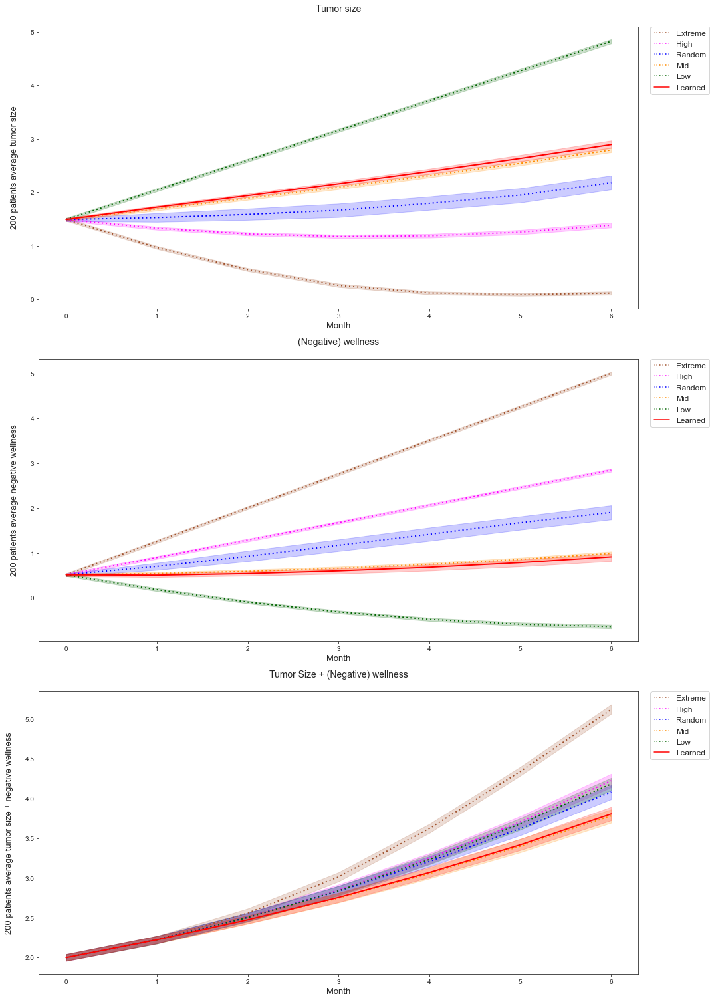


Policy Iteration: 6 - Evaluation results:
                         - Avg. ending tumor size : 2.8931332051131955
                         - Avg. max. toxicity : 1.5334422500625657
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.956634424385129
                         - Avg. prob. of death : 0.7357453650443871



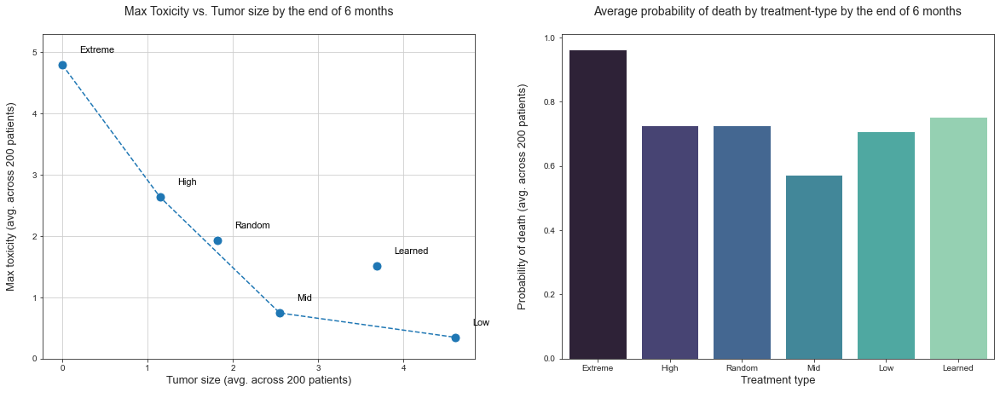

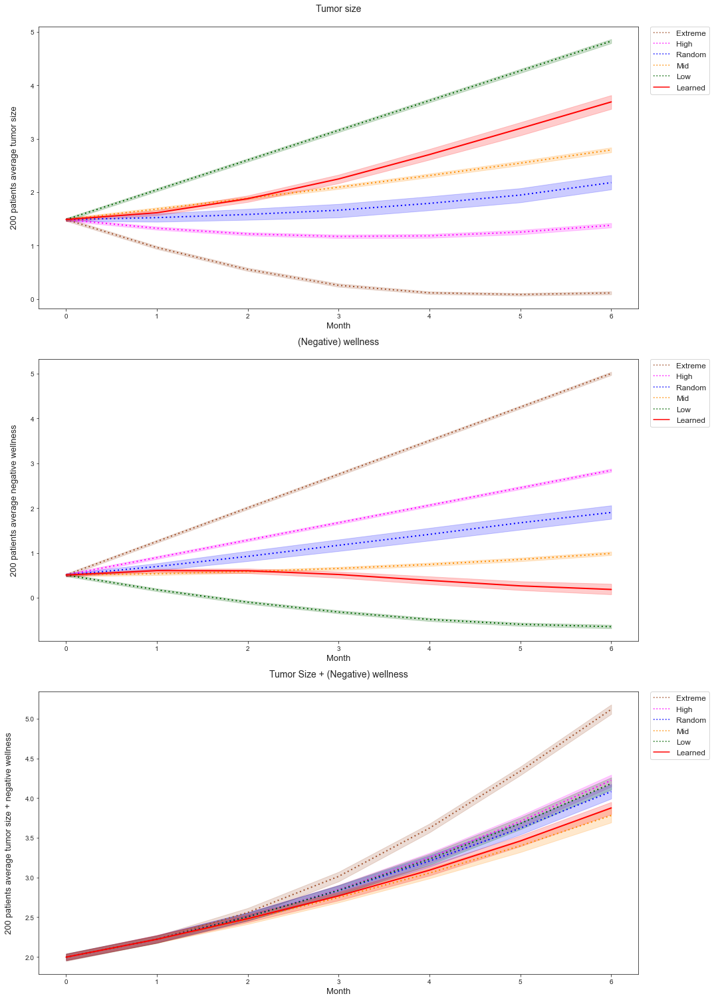


Policy Iteration: 7 - Evaluation results:
                         - Avg. ending tumor size : 3.6894065413045287
                         - Avg. max. toxicity : 1.5119125464252263
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.960378489081937
                         - Avg. prob. of death : 0.7539549111211451



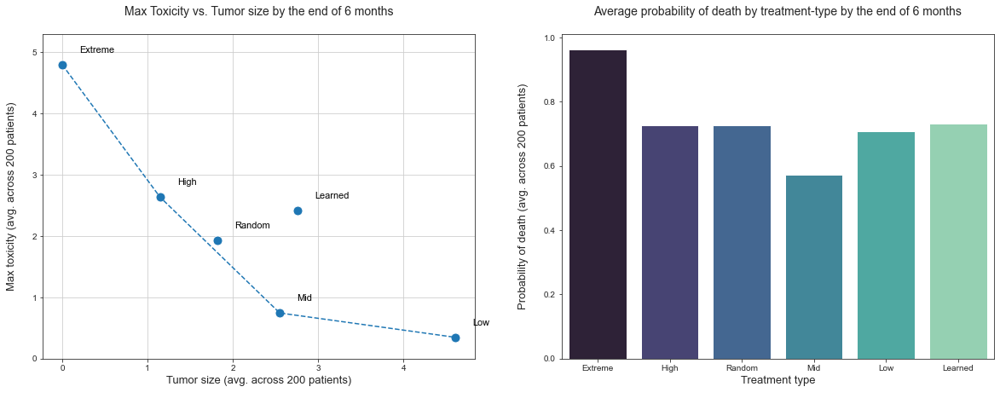

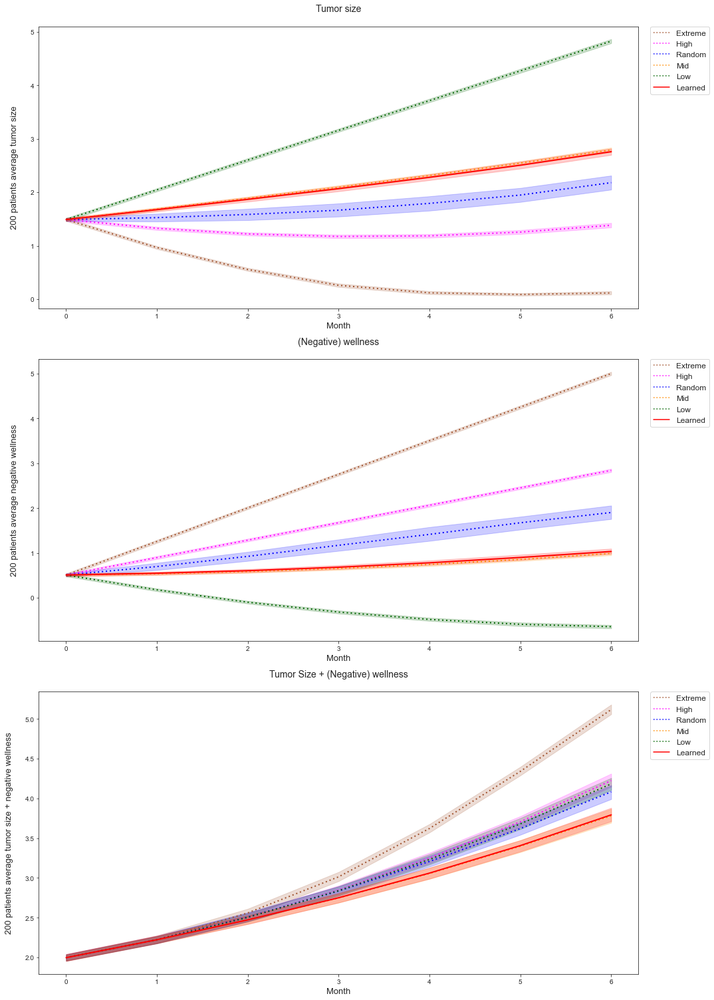


Policy Iteration: 8 - Evaluation results:
                         - Avg. ending tumor size : 2.759035871195751
                         - Avg. max. toxicity : 2.4150606650563726
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.955725619911591
                         - Avg. prob. of death : 0.7317701133356707



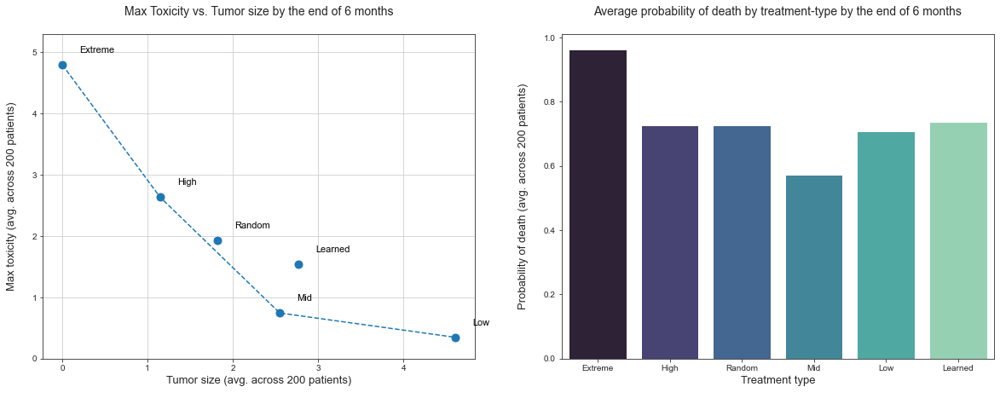

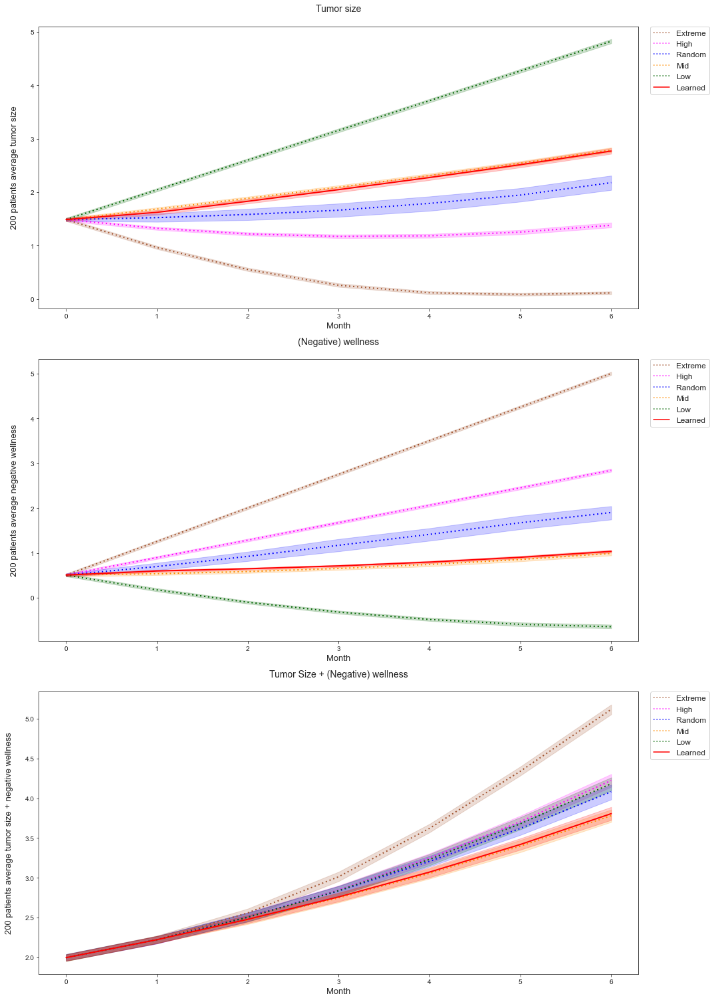


Policy Iteration: 9 - Evaluation results:
                         - Avg. ending tumor size : 2.771003918468029
                         - Avg. max. toxicity : 1.5334422500625657
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9570295506249185
                         - Avg. prob. of death : 0.736291152216066



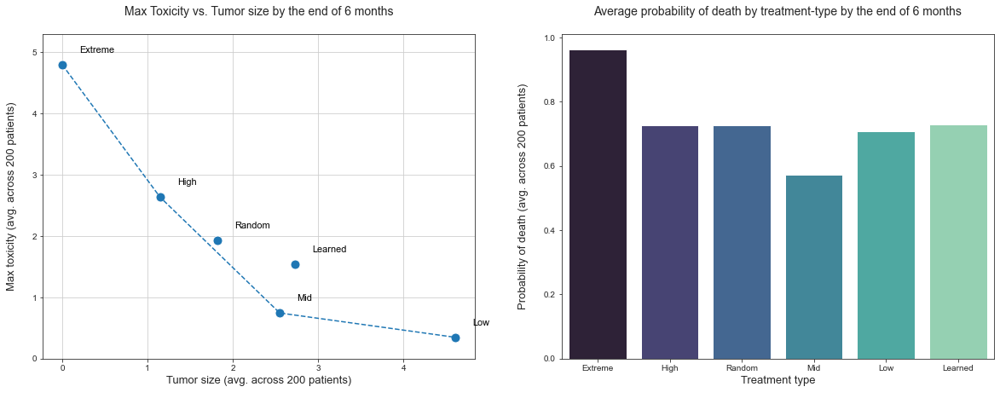

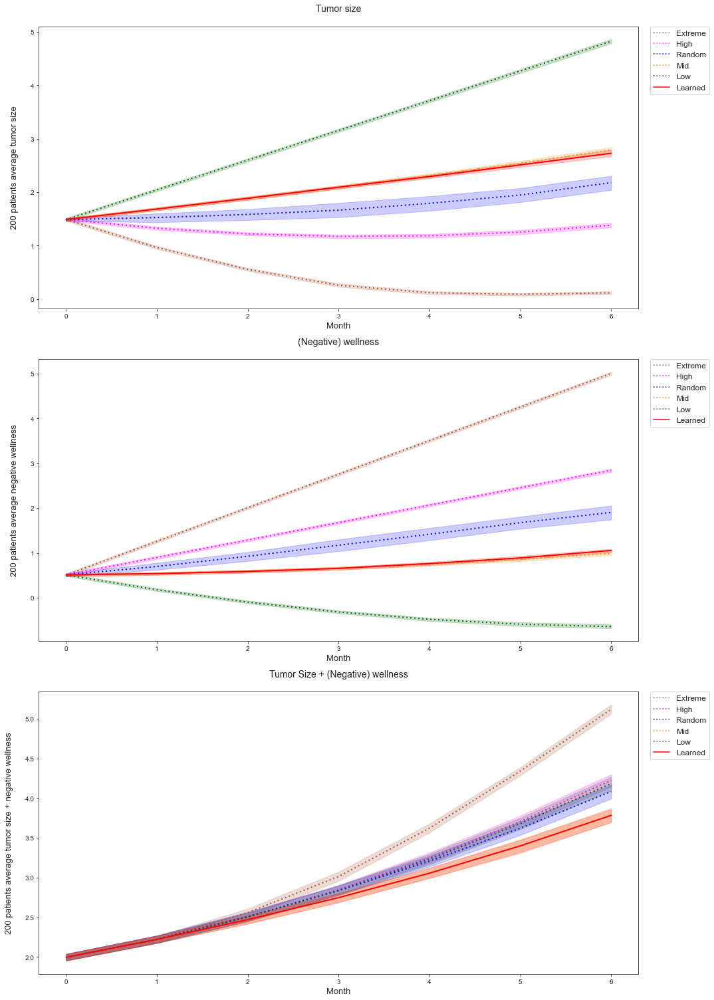


Policy Iteration: 10 - Evaluation results:
                         - Avg. ending tumor size : 2.729043617653832
                         - Avg. max. toxicity : 1.5334422500625657
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9551220229200146
                         - Avg. prob. of death : 0.7286966655636152


Evaluations: 100%|██████████| 1/1 [2:44:48<00:00, 9888.08s/it]


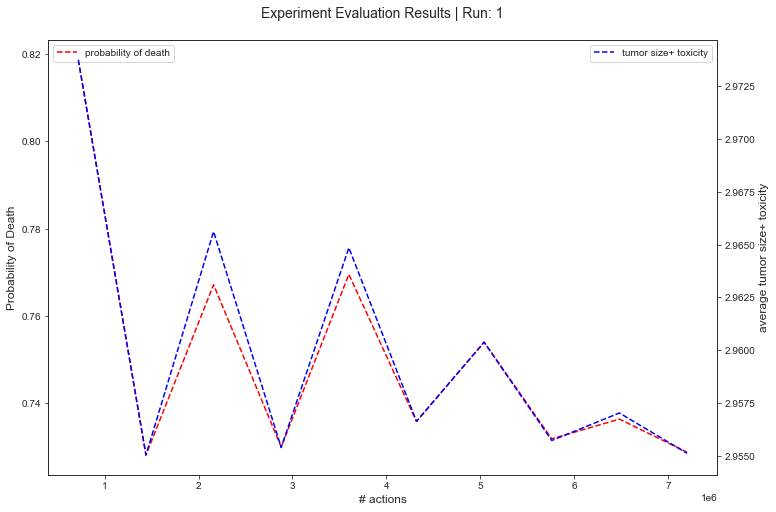

In [10]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 6
                                                , treatment_length_eval     = 6
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = True # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 3
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

---
## TO-DO: Lengthier treatment regime - 6 months training data -> 12 months evaluation